# Unidad 4 Práctica Individual
### Nicole Patricia Góngora Rodríguez
### 8vo Semestre
### Ing. Sistemas Computacionales


In [ ]:
# Importando cada librería esencial antes de cargar la base de datos
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
from plotly.offline import iplot
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt

In [ ]:
#  Cargando el dataset
from google.colab import files
uploaded = files.upload()

Saving housing_train.csv to housing_train.csv


# Análisis previo de datos (no está en el informe por espacio)

In [ ]:
housing = pd.read_csv('housing_train.csv')
# Muestra las primeras lineas de un dataset
housing.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [ ]:
# ¿Se cargaron todos los datos?
housing.shape

(1460, 81)

In [ ]:
# Muestra las últimas lineas de un dataset
housing.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


In [ ]:
# La información en general de los datos y tipos de cada columna, sin estadísticas, considerando valores nulos
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [ ]:
# Lista las columnas del dataset
housing.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [ ]:
# Todas las características estadísticas básicas en cada variable numérica de la base de datos
# N° de filas no nulas, media, desviación estandar, quartiles de distribución 0.25 a 0.75 (0.50 es la mediana)
# para evaluar el nivel de dispersión de la base de datos
pd.set_option('display.max_columns', None) #Para que muestre TODAS las columnas
housing.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [ ]:
objects=[]
nums=[]
for col in housing.columns:
  if housing[col].dtype=="object":
    objects.append(col)
  else:
    nums.append(col)
round(len(objects)/len(housing.columns)*100,2),round(len(nums)/len(housing.columns)*100,2),len(objects),len(nums)

(53.09, 46.91, 43, 38)

In [ ]:
nullsOb=[]
nullsNum=[]
for col in housing.columns:
  if housing[col].isna().sum()>0:
    if housing[col].dtype=="object":
      nullsOb.append((col,round(housing[col].isna().sum()/len(housing)*100,2)))
    else:
      nullsNum.append((col,round(housing[col].isna().sum()/len(housing)*100,2)))
nullsOb,len(nullsOb),nullsNum,len(nullsNum),len(nullsNum)+len(nullsOb)

([('Alley', 93.77),
  ('MasVnrType', 0.55),
  ('BsmtQual', 2.53),
  ('BsmtCond', 2.53),
  ('BsmtExposure', 2.6),
  ('BsmtFinType1', 2.53),
  ('BsmtFinType2', 2.6),
  ('Electrical', 0.07),
  ('FireplaceQu', 47.26),
  ('GarageType', 5.55),
  ('GarageFinish', 5.55),
  ('GarageQual', 5.55),
  ('GarageCond', 5.55),
  ('PoolQC', 99.52),
  ('Fence', 80.75),
  ('MiscFeature', 96.3)],
 16,
 [('LotFrontage', 17.74), ('MasVnrArea', 0.55), ('GarageYrBlt', 5.55)],
 3,
 19)

Con el análisis previo, se pueden observar las siguientes características:

+ De las 81 columnas de la base de datos, existen 19 columnas con datos nulos, de las cuales 16 son categóricas y 3 son numéricas/flotantes
+ Aquellas con un porcentaje más alto de valores faltantes son el acceso al callejón, la calidad de la chimenea, la calidad de la piscina, adiciones misceláneas y tipo de cerca
+ El número de columnas categóricas está casi equilibrado con el de numéricas, siendo 43 de tipo object y 38 de tipo int/float64 respectivamente

# Datos estadísticos de las categorías numéricas

Realizar una visualización estadística de las variables numéricas ante el precio, el cual es un valor objetivo.

In [ ]:
pd.set_option('display.max_columns', None) #Para que muestre TODAS las columnas
housing.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


A partir de estas visualizaciones previas obtenidas, se pueden apreciar las siguientes observaciones:
-	Existen variables como la superficie final de las superficies acabadas 1 y 2 del sótano, la superficie de revestimiento de mampostería, y el área del segundo piso cuyas distribuciones de datos no están muy bien distribuidas, lo que le quita las secciones de los primeros cuartiles y reduce la mediana a cero. Esto nos puede decir que estas variables o atributos no están muy presentes en las propiedades: hay más casas con solo un piso y un tipo de superficie de sótano, así con las paredes sin cobertura de mampostería externa.
-	La calidad y condición de las casas se inclina a un estado medio, con una subclase de construcción 50 y construidas/remodeladas alrededor de los 80’ y 90. Así mismo, muchas casas contienen sótanos, y un área de parcela de 9478.5 pies (880 metros) cuadrados, lo cual indica un tamaño grande de casas.


In [ ]:
def barplots(dataset,col):

  fig = go.Figure(data=[go.Box(y=dataset[col],
            boxpoints='all', # can also be outliers, or suspectedoutliers, or False
            jitter=0.3, # add some jitter for a better separation between points
            pointpos=-1.8 # relative position of points wrt box
              )])
  titl="Diagrama de cajas de la columna "+col
  fig.update_layout(title=titl,width=1000)
  fig.show()

In [ ]:
fileter=filter(lambda colu: (housing[colu].dtype != 'object'), housing.columns)
lisfil=list(fileter)

In [ ]:
for lis in lisfil:
  barplots(housing,lis)

Gracias a las gráficas mostradas, se puede observar las siguientes cualidades:

A. Variables numéricas como ID, MSSubClass (clase de construcción), OverallQual (calidad del material y acabado), OverallCond (condición general), todas aquellas con el prefijo Year o Yr (correspondiente al año: YrSold (año de venta), GarageYrBlt (año de construcción del garaje), YearRemodAdd (año de remodelación), YearBuilt (Año de construcción)), MoSold (el mes de venta) serían más categóricas que numéricas/estadísticas en sí, ya que se puede clasificar una casa por su calidad, su tipo de construcción, el año y mes en el que fue construida/remodelada/vendida

B. Las variables numéricas/estadísticas que quedan, siendo correspondientes, en general:

1. Al número de objetos como chimeneas, o habitaciones, tanto normales como baños, cocinas; incluso el tamaño del garaje medido en plazas de autos
2. A las medidas de superficie y área de las habitaciones y las casas en sí en pies, así como el valor en dólares de características misceláneas.

Están, en su mayoría, bien distribuidas, con las siguientes observaciones:

1. Algunas no tienen mediana, es decir, al tener sus valores 0, crean una distribución de quartiles en las que el primero y segundo no existen
2. Otras tienen buenas distribuciones, pero con extremos muy distantes

Por lo tanto, luego del análisis de categorías y sus frecuencias, hay que normalizar esta información. Esto, no solamente para dar una mejor explicación antes de convertir las categorías para la regresión, sino para determinar el impacto de los datos faltantes.
Así mismo, a primera vista se pueden eliminar columnas donde no se vea mucha presencia, como el área y calidad de la piscina, el porche de tres estaciones, los baños medios en el sótano, porque se observa (véase en el Notebook) que muchas casas no contienen este atributo (visto en la mediana y los cuartiles nulos) y que la minoría se distribuye en pocas unidades en el aire, junto al Id al ser una columna de identidad más que de clasificación o calificación. Esto habría que observar con la matriz de correlación en el siguiente paso.


# Análisis de frecuencia de clases en variables categóricas

Antes de la normalización y categorización de las variables, hay que conocerlas a fondo. Se considerarán categóricas no solo a las variables con tipo "object" identificados en sus columnas, sino tambien a las numéricas antes mencionadas

In [ ]:
catNums=["MSSubClass","OverallQual","OverallCond","YrSold","GarageYrBlt","YearRemodAdd","YearBuilt","MoSold"]
catob=objects

categoricas=catNums+catob
for cat in categoricas:
  print(housing[cat].value_counts(),housing[cat].value_counts().sum())

20     536
60     299
50     144
120     87
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: MSSubClass, dtype: int64 1460
5     397
6     374
7     319
8     168
4     116
9      43
3      20
10     18
2       3
1       2
Name: OverallQual, dtype: int64 1460
5    821
6    252
7    205
8     72
4     57
3     25
9     22
2      5
1      1
Name: OverallCond, dtype: int64 1460
2009    338
2007    329
2006    314
2008    304
2010    175
Name: YrSold, dtype: int64 1460
2005.0    65
2006.0    59
2004.0    53
2003.0    50
2007.0    49
          ..
1927.0     1
1900.0     1
1906.0     1
1908.0     1
1933.0     1
Name: GarageYrBlt, Length: 97, dtype: int64 1379
1950    178
2006     97
2007     76
2005     73
2004     62
       ... 
2010      6
1986      5
1952      5
1983      5
1951      4
Name: YearRemodAdd, Length: 61, dtype: int64 1460
2006    67
2005    64
2004    54
2007    49
2003    45
        ..
1875     1
1

In [ ]:
len(categoricas)

51

In [ ]:
def makeHist(dataf,cols):
  tuples=()
  specsl=[]
  count=0
  liste=[]
  for col in cols:
    titl="Histograma del atributo "+col
    tuples=tuples+(titl,)
    liste.append({'type':'xy'})
    if count==1:
      specsl.append(liste)
      liste=[]
      count=0
    else:
      count+=1
  fig=make_subplots(rows=4,cols=2,subplot_titles=tuples,specs=specsl)
  rowc=1
  colc=1
  for col in cols:
    fig.add_trace(go.Histogram(x=dataf[col]),row=rowc,col=colc)
    if colc==2:
      rowc+=1
      colc=1
    else:
      colc+=1
  fig.update_layout(height=1500,width=1250,autosize=True,showlegend=False,title="Histogramas de variables categóricas")
  fig.show()

In [ ]:
def makeBarPlot(dataset, col):
  gr=dataset.groupby(col)
  fig = go.Figure(data=[go.Bar(x=list(gr.groups.keys()),y=gr[col].count(),marker_color='cyan')])
  titl="Diagrama de cajas de la columna "+col
  fig.update_layout(title=titl,width=1000)
  fig.show()

In [ ]:
for col in catob:
  makeBarPlot(housing,col)

In [ ]:
mpl.rc('font', size=20)
mpl.rc('axes', titlesize=20)
figure, axes = plt.subplots(nrows=22, ncols=2,figsize=(60,200)) #22 filas contra 2 columnas, para los 43 atributos
figure.tight_layout()
# Generando una iteración por cada columna categórica:

axx=0
axy=0
for col in catob:
  titl="Precios distribuidos por "+col
  sns.barplot(x=col, y='SalePrice', data=housing, ax=axes[axx, axy])
  axes[axx, axy].set(title=titl)
  axes[axx, axy].tick_params(axis='x', labelrotation=90)
  if axy==1:
    axy=0
    axx+=1
  else:
    axy+=1

plt.savefig('housing.png')

In [ ]:
makeHist(housing,catNums)

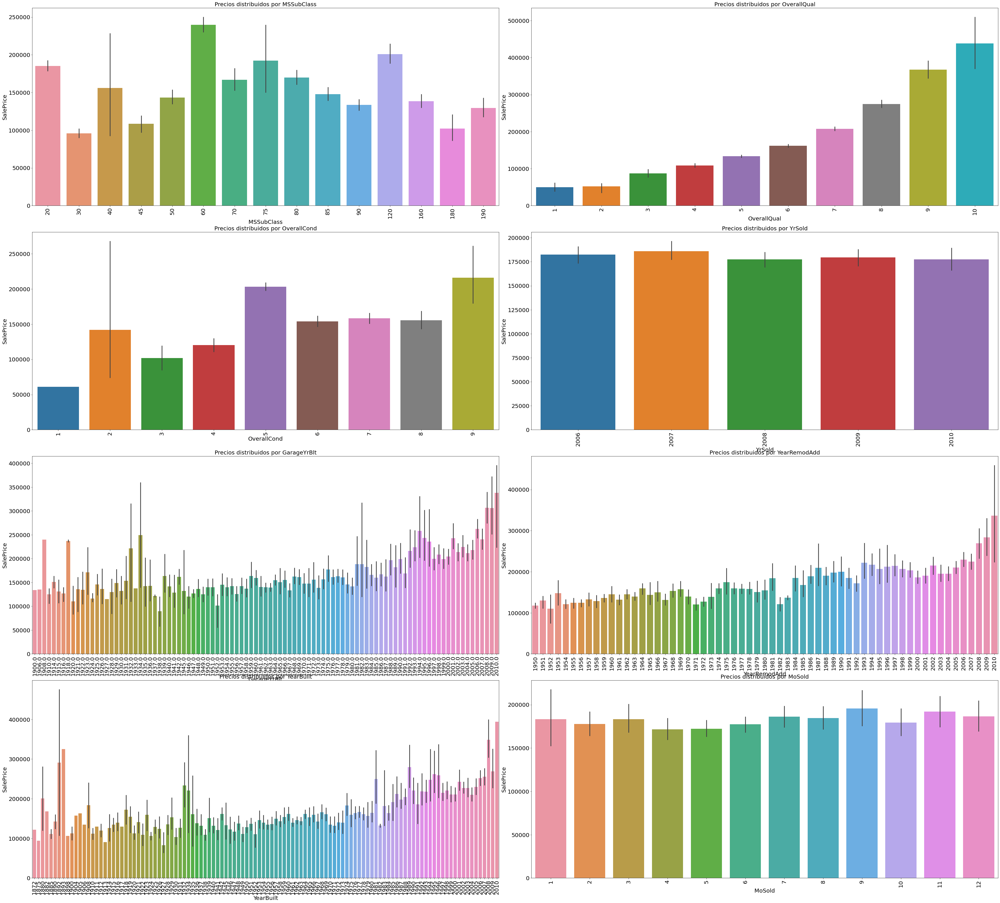

In [ ]:
mpl.rc('font', size=20)
mpl.rc('axes', titlesize=20)
figure, axes = plt.subplots(nrows=4, ncols=2,figsize=(50,45)) #4 filas contra 2 columnas, para los 43 atributos
figure.tight_layout(pad=3)
# Generando una iteración por cada columna categórica:

axx=0
axy=0
for col in catNums:
  titl="Precios distribuidos por "+col
  sns.barplot(x=col, y='SalePrice', data=housing, ax=axes[axx, axy])
  axes[axx, axy].set(title=titl)
  axes[axx, axy].tick_params(axis='x', labelrotation=90)
  if axy==1:
    axy=0
    axx+=1
  else:
    axy+=1

plt.savefig('housing2.png')

A partir de esta visualización de la cantidad de clases y su frecuencia en la base de datos, se pueden realizar conclusiones de inferencia:

-	Las mejores ventas de los inmuebles se realizaron en el mes de septiembre en el rango de años 2006 al 2010; con transacciones parciales y nuevas acumulando mejor distribución. Sin embargo, hubo más ventas de mayo a julio y menos casas vendidas en el 2010
-	Las casas de la categoría 20 de construcción son más frecuentes en el registro, un buen cúmulo entre los 50’ a 70’, la mayoría edificadas y/o remodeladas en el 2010. Pero aquellas con mayor acumulación de dinero fueron aquellas de categoría 60 desde los 80’ a los 2010.
-	La calidad de los inmuebles es media, calificada de 4 a 5 puntos en este rubro, pero aquellas que acumularon más dinero de venta se acercan a 9 a 10 puntos.
-	Las casas que aportan más valor a su precio son aquellas de clasificación FV, caminos pavimentados a la calle y empedrados al callejón, lote con una sola entrada de forma IR2 y contorno HLS con todos los servicios. Además, cuentan con mampostería de piedra, exteriores de excelente calidad formados con estuco, techos compuestos de forma diagonal uniforme (shed) y capacidad para una familia mediante dos plantas con sótano terminado (2.5 fin). Se ubican en los barrios NoRidge, StoneBr y NRidgHt, tienen sótanos de gran calidad con paredes a nivel del jardín, calefacción a gas, sistema eléctrico Sbrkr y garajes internos en la casa.
-	La mayoría de las casas son de un piso, para una sola familia, de techo triangular compuesto y acceso normal al lote, en barrios fuera de Ames (NAmes) con todos los servicios y un contorno de territorio nivelado y regular.
-	A diferencia de la calidad y el mes de calidad, todas las variables categóricas numéricas están distribuidas irregularmente, con pendientes hacia años recientes o separación de clases


Gracias a esto, se pueden generar varias conclusiones de entrada de los posibles aportadores al precio de una casa mediante algunos análisis exploratorios en ejercicios alternativos

## Ejercicios de análisis exploratorios:

In [ ]:
def checkValue(dataf,val):
  cols=[]
  for col in dataf.columns:
    typeCol=dataf.dtypes[col]
    if typeCol==np.object:
      if len(dataf[dataf[col]==val])>0:
        cols.append(col)
  return cols

In [ ]:
colum=checkValue(housing,"Gd")
colum

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DeprecationWarning:

`np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



['ExterQual',
 'ExterCond',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'HeatingQC',
 'KitchenQual',
 'FireplaceQu',
 'GarageQual',
 'GarageCond',
 'PoolQC']

In [ ]:
housing.Functional.unique()

array(['Typ', 'Min1', 'Maj1', 'Min2', 'Mod', 'Maj2', 'Sev'], dtype=object)

In [ ]:
housing.SaleCondition.unique()

array(['Normal', 'Abnorml', 'Partial', 'AdjLand', 'Alloca', 'Family'],
      dtype=object)

### Ejercicio 1
Con una torta, graficar el porcentaje de casas vendidas según la condición de la venta

In [ ]:
def ejercicio1(dataset,col):
  porcen=[]
  cants=[]
  tot=dataset[col].count()
  uniq=dataset[col].unique()
  for uni in uniq:
    filter=dataset[dataset[col]==uni]
    cant=filter[col].count()
    por=round(cant/tot*100,2)
    cants.append(cant)
    porcen.append(por)
  return porcen,cants,uniq

In [ ]:
vals,vals2,labe=ejercicio1(housing,"SaleCondition")

fig = go.Figure()
fig.add_trace(go.Pie(values=vals2,labels=labe))
titl="Torta de distribución de ventas por calidad"
fig.update_layout(title=titl)
fig.show()

### Ejercicio 2
Con un histograma, grafica la distribución del precio de venta

In [ ]:
def ejercicio2(dataset,column,titl,xax,yax):
  fig = go.Figure()
  fig.add_trace(go.Histogram(x=dataset[column]))
  fig.update_layout(title=titl,xaxis_title=xax, yaxis_title=yax)
  fig.show()

In [ ]:
ejercicio2(housing,"SalePrice","Histograma de distribución de precios de venta","Precios","# Casas")

### Ejercicio 3

Obtener un gráfico de barras de las casas registradas cuyo año de construcción sea desde los 2000 y haya sido vendida en el mismo año de su construcción. Clasificar las barras por año

In [ ]:
def ejercicio3(dataset,col1,col2):
  df=dataset[(dataset[col1]>=2000)&(dataset[col1]==dataset[col2])]
  labs=df[col1].unique()
  group=df.groupby(col1)
  return df,labs,group

In [ ]:
dataf,labs,gr=ejercicio3(housing,"YearBuilt","YrSold")
fig = go.Figure()
fig.add_trace(go.Bar(x=labs,y=gr["YrSold"].count(),marker_color='purple'))
fig.update_layout(title="Gráfica de barras de casas construidas y vendidas al mismo año, desde 2000",xaxis_title="Años de venta/construcción", yaxis_title="# de casas")
fig.show()


### Ejercicio 4

Obtener la distribución de tipos y estilos de vivienda en tortas y/o barras en las que la calidad de TODOS los atributos obtenidos de la lista columa (llena de atributos importantes de casa con calificación de calidad) sea excelente (Es decir, "Ex"), regular ("Gd") y pobre ("Po").

In [ ]:
np.array(colum)

array(['ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'HeatingQC', 'KitchenQual', 'FireplaceQu', 'GarageQual',
       'GarageCond', 'PoolQC'], dtype='<U12')

In [ ]:
columa=['ExterQual','KitchenQual','HeatingQC','GarageQual']

In [ ]:
def ejercicio4(dataset,colum,val):
  dat=[]
  for col in colum:
    fil=dataset[dataset[col]==val]
    dat=fil
  grEs=dat.groupby("HouseStyle")
  grTi=dat.groupby("BldgType")
  return dat,grEs,grTi


In [ ]:
dfa,gr1a,gr2a=ejercicio4(housing,columa,"Ex")
dfb,gr1b,gr2b=ejercicio4(housing,columa,"Gd")
dfc,gr1c,gr2c=ejercicio4(housing,columa,"Po")

In [ ]:
gr1b.groups.keys()

dict_keys(['1.5Fin', '1.5Unf', '1Story', '2.5Unf', '2Story', 'SLvl'])

In [ ]:
gr2c.groups.keys()

dict_keys(['1Fam', '2fmCon'])

In [ ]:
fig=make_subplots(rows=3,cols=2,subplot_titles=("Torta de estilos de casa con calidad Excelente de atributos","Barras de tipos de construcciones con calidad Excelente de atributos",
                                                "Torta de estilos de casa con calidad Regular de atributos","Barras de tipos de construcciones con calidad Regular de atributos",
                                                "Torta de estilos de casa con calidad Pobre de atributos","Barras de tipos de construcciones con calidad Pobre de atributos"),
                  specs=[[{'type':'domain'},{'type':'xy'}],[{'type':'domain'},{'type':'xy'}],[{'type':'domain'},{'type':'xy'}]])
fig.add_trace(go.Pie(values=gr1a["HouseStyle"].count(),labels=list(gr1a.groups.keys())),row=1,col=1)
fig.add_trace(go.Bar(x=list(gr2a.groups.keys()),y=gr2a["BldgType"].count(),marker_color='cyan'),row=1,col=2)
fig.add_trace(go.Pie(values=gr1b["HouseStyle"].count(),labels=list(gr1b.groups.keys())),row=2,col=1)
fig.add_trace(go.Bar(x=list(gr2b.groups.keys()),y=gr2b["BldgType"].count(),marker_color='magenta'),row=2,col=2)
fig.add_trace(go.Pie(values=gr1c["HouseStyle"].count(),labels=list(gr1c.groups.keys())),row=3,col=1)
fig.add_trace(go.Bar(x=list(gr2c.groups.keys()),y=gr2c["BldgType"].count(),marker_color='purple'),row=3,col=2)
fig.update_layout(height=1200,autosize=True,showlegend=False)
fig.show()


### Ejercicio 5

Generar un histograma de calor que relacione el área de los garajes con respecto a la capacidad en autos que tienen, según el tipo de la zona de la casa

In [ ]:
def ejercicio5(dataf,colum1,column2,colqual,qual):
  dataset=dataf[dataf[colqual]==qual]
  ara=dataset[colum1]
  car=dataset[column2]
  fig = go.Figure()
  fig.add_trace(go.Histogram2d(x=ara,y=car))
  titl="Mapa de calor de casas en zonas tipo "+qual+" según "+colum1+ " y "+column2
  fig.update_layout(title=titl,xaxis_title=colum1, yaxis_title=column2)
  fig.show()

In [ ]:
housing.MSZoning.unique()

array(['RL', 'RM', 'C (all)', 'FV', 'RH'], dtype=object)

In [ ]:
ejercicio5(housing,"GarageArea","GarageCars","MSZoning","RL")

### Ejercicio 6

Realizar un gráfico de línea de suma de ventas por año, y otro de suma de ventas por mes según un año

In [ ]:
def ejercicio6(dataf,sales,month,year,yearso):
  grou=dataf.groupby(year)
  daf=dataf[dataf[year]==yearso]
  daf2=daf[[month,sales]]
  if len(daf2[month].unique())<12:
    for i in range(1+len(daf2[month].unique()),13):
      new_row = {month:i, sales:0}
      daf2 = daf2.append(new_row, ignore_index=True)
  grou2=daf2.groupby(month)
  titl="Ventas totales por año"
  titl2="Ventas totales por mes del año "+str(yearso)
  listofmedia=[grou[sales].sum().mean() for i in range(2006,2011,1)]
  listofmedia2=[grou2[sales].sum().mean() for i in range(0,13,1)]
  print(grou[sales].sum().mean())
  fig=make_subplots(rows=1,cols=2,subplot_titles=(titl,titl2),specs=[[{'type':'xy'},{'type':'xy'}]])
  fig.add_trace(go.Scatter(x=list(range(2006,2011,1)),y=listofmedia,mode="lines",line=dict(color="purple")),row=1,col=1)
  fig.add_trace(go.Scatter(x=list(grou.groups.keys()),y=grou[sales].sum(),mode="lines",line=dict(width=3,dash="dash",color="red")),row=1,col=1)
  fig.add_trace(go.Scatter(x=list(grou.groups.keys()),y=grou[sales].sum(),mode="markers",marker=dict(color="magenta",symbol="circle",size=10)),row=1,col=1)
  fig.add_trace(go.Scatter(x=list(range(1,13,1)),y=listofmedia2,mode="lines",line=dict(color="purple")),row=1,col=2)
  fig.add_trace(go.Scatter(x=list(grou2.groups.keys()),y=grou2[sales].sum(),mode="lines",line=dict(width=3,dash="dash",color="blue")),row=1,col=2)
  fig.add_trace(go.Scatter(x=list(grou2.groups.keys()),y=grou2[sales].sum(),mode="markers",marker=dict(color="cyan",symbol="circle",size=10)),row=1,col=2)
  fig.update_layout(showlegend=False)
  fig.show()


In [ ]:
ejercicio6(housing,"SalePrice","MoSold","YrSold",2007)

52828989.2


### Ejercicio 7

Realizar un gráfico de barras dobles del número de baños completos y parciales, todos por clases de construcción

In [ ]:
def ejercicio7(dataf,classe):
  labs=sorted(dataf[classe].unique())
  gru=dataf.groupby(classe)


  fig=make_subplots(rows=1,cols=1,
                    specs=[[{'type':'xy'}]])
  fig.add_trace(go.Bar(name="Baños completos",x=labs,y=gru["FullBath"].sum(),marker_color="red"),row=1,col=1)
  fig.add_trace(go.Bar(name="Baños parciales",x=labs,y=gru["HalfBath"].sum(),marker_color="magenta"),row=1,col=1)

  fig.update_layout(title="Baños parciales y completos según clases de construcción",width=1000,height=500,showlegend=False)
  fig.show()

In [ ]:
ejercicio7(housing,"MSSubClass")

### Ejercicio 8

Realizar un gráfico de scatter del precio de casa según el tamaño de la parcela, así como una línea que indique la media de este precio

In [ ]:
def ejercicio8(dataf,tam,pre):
  listofmedia=[dataf[pre].mean() for i in range(0,round(dataf[tam].max()),1)]

  fig = go.Figure()

  fig.add_trace(go.Scatter(x=dataf[tam],y=dataf[pre],mode="markers",marker=dict(color="cyan",symbol="circle",size=10)))
  fig.add_trace(go.Scatter(x=list(range(0,round(dataf[tam].max()),1)),y=listofmedia,mode="lines",line=dict(color="purple",dash="dash",width=2)))
  titl="Gráfica de puntos del precio de venta con respecto al tamaño de parcela"
  fig.update_layout(showlegend=False,height=800,title=titl,xaxis_title="Tamaño de la parcela (pies cuadrados)", yaxis_title="Precio en dólares")
  fig.show()

In [ ]:
ejercicio8(housing,"LotArea","SalePrice")

-	**Hipótesis:** Las mejores ventas se realizarán en meses desde mayo a septiembre.
-	**Hipótesis:** Hay casas que se venden el mismo año que se construyeron, es decir, que pueden agregarle el factor de novedad al precio de venta. Estas van desde el 2006 al 2010, el primer año teniendo más registros.
-	El área más común del garaje es de 400 a 500 pies cuadrados, con capacidad para 2 autos. **Hipótesis:** El precio del inmueble más alto puede predominar en este rango.
-	Hay más variedad en estilo de casas y construcciones para los inmuebles con una calidad regular de atributos como la calefacción, la cocina, el exterior y el garaje; mientras que aquellas con calidad excelente o pobre se limitan a 2 o 3 estilos de casa y 1 a 2 tipos de construcciones.
-	**Hipótesis:** Las parcelas con 1300 a 171.000 pies de área acumulan precios desde aproximadamente 8000 a 300000 dólares, aquellas de mayor tamaño y/o precio dispersándose distantemente. Estas son las que mayor valor de precio pueden aportar.
-	En todos los tipos de construcciones, el número de baños completos influye más que el de los medios, habiendo algo de equilibrio en zonas de categoría 160.


# Matriz de correlación de variables. Versión previa a la normalización y limpieza-llenado de datos

Para determinar el nivel de cohesión y vinculo de las variables numéricas ante el precio de una casa y entre estas mismas, se debe crear una matriz de correlación

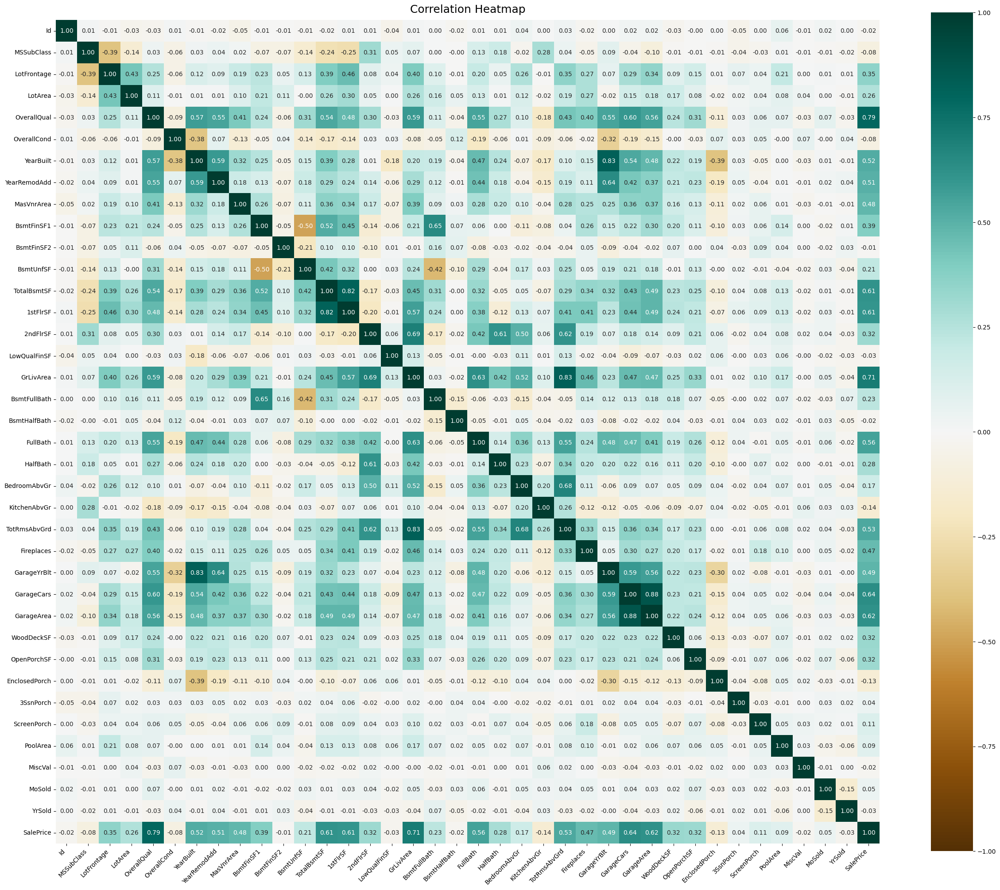

In [ ]:
mpl.rcParams.update(mpl.rcParamsDefault)
corr = housing.corr(method ='pearson')

plt.figure(figsize=(30, 30))
ax = sns.heatmap(
 corr,
 vmin=-1, vmax=1, center=0,
 cmap='BrBG',
 square=True, annot=True, fmt=".2f",
 cbar=True,cbar_kws={"shrink": .82}
)

ax.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);
ax.set_xticklabels(
 ax.get_xticklabels(),
 rotation=45,
 horizontalalignment='right'
)

plt.savefig('heatmap.png', dpi=300, bbox_inches='tight')

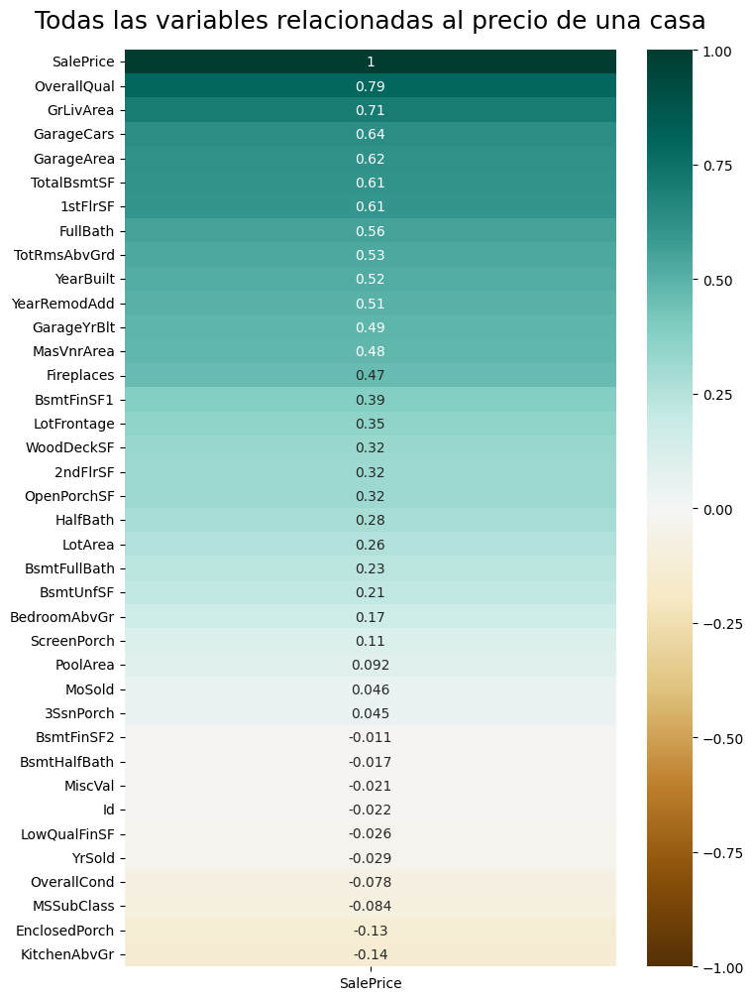

In [ ]:
plt.figure(figsize=(8, 12))
heatmap = sns.heatmap(housing.corr()[['SalePrice']].sort_values(by='SalePrice', ascending=False), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Todas las variables relacionadas al precio de una casa', fontdict={'fontsize':18}, pad=16);

Esta contemplación gráfica de la correlación se pueden identificar las variables con mayor correlación (al menos mayor a 50%):

**Entre aquellas que no son el precio:**
- El año de construcción del garaje está muy vinculado al año en el que la construcción ha sido edificada, talvez debido a que ambos hayan sido edificados en el mismo periodo como se vio en los gráficos de frecuencia de categorías.
- La calidad en general de la construcción tiene una mayor dependencia al año de la construcción del garaje, la cantidad de baños completos, el área disponible sobre el nivel de suelo, el área total del sótano y el primer piso, el año de construcción y de remodelación de la casa, y el área del garaje en pies y autos.
- El año de remodelación se vincula al año de construcción de la casa, probablemente debido a que se realice esta acción en el mismo periodo. Lo mismo con el año de construcción del garaje, por la misma razón hipotética
- El área total del sótano tiene una correlación intensa con la primera área, seguida de la segunda y parcial (incompleta), debido a que es una suma de estas variables, en especial de aquella con mayores registros mayores a 0; así como del área de calle de la parcela. El área incompleta del sótano, en cambio, depende de manera fuerte pero negativa del número de baños y el área completa tipo 1: es decir, mientras más aumenten estos últimos, se ocupa más espacio sin acabar, por lo que esta cantidad se reduce mucho.
- El área sobre el nivel del suelo depende mucho de los cuartos disponibles en este sector, seguido del área del segundo y primer piso junto al sótano, el número de baños completos y medios, el área de garaje y las chimeneas.
- Él área de los cuartos sobre el suelo depende del número de los dormitorios y los baños, tanto completos como parciales, así como del área del segundo piso y ligeramente del primero.
- Los dos tipos de área del garaje se relacionan uno al otro fuertemente, esto debido a que uno justifica al otro en una distinta medida (# de autos – pies cuadrados). Así mismo, los dos casi paralelamente dependen del año de construcción del garaje, el año de construcción/remodelación de la casa, y las áreas por encima del nivel del suelo, el sótano y el primer piso.
- El primer piso del área, aparte del garaje y el sótano en áreas, depende del área de pies lineales de calle, así como del número de chimeneas.

**Con respecto al precio, de mayor a menor correlación:**

- La calidad en general de la casa afecta mucho la proporción del precio, esto talvez sea a que, a mayor perfección del inmueble, mejor se vende.
- El área disponible sobre el nivel del suelo y las habitaciones encima de este sector también influyen en el precio, esto probablemente debido a que permite tener una mejor calidad de los cuartos y espacios para que se puedan distribuir.
- Las superficies y áreas terminadas del sótano, garaje y el primer piso le siguen, justificado en una hipótesis de que, al haber registros que confirmen la existencia de sótano, garaje y al menos una planta en la construcción, estos sean influyentes en el valor de venta según su valor suba.
-	El año de remodelación y construcción parece tener una correlación algo liviana pero resaltable en el precio, esto explicado por los gráficos de la distribución de precios según años en los que muestran un crecimiento del valor de venta según avanzara el tiempo.

Viendo estas correlaciones, se observan posibles columnas a eliminarse:
-	Si bien la calidad del material y el acabado son importantes, hay ya atributos que pueden cubrirla una vez categorizados en cifras (material del techo, calidad del material exterior, calidad de la cocina, etc.), sin acumular demasiado valor que afecte la dependencia del precio.
-	El área de superficie habitable por encima del suelo puede ser mejor explicada y menos acumulativa al separarla con las áreas del primer y segundo piso, del lote, e incluso con las habitaciones por encima del suelo.
-	Lo mismo con el área total del sótano, ya que existen columnas que explican mejor su valor (la altura del sótano, las superficies acabadas y sin terminar), reduciendo dependencia en la variable del primer piso
-	Una de las variables del garaje, la de los autos que pueden entrar, podría quitarse, ya que el área de por sí sola explica el tamaño de este sector


In [ ]:
housing=housing.drop("Id",axis=1)
housing

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,Y,FuseA,1078,0,0,1078,1,0,1,0,2,

# Identificación y llenado de los datos faltantes

In [ ]:
for nul in nullsNum:
  print(housing[nul[0]].describe())

count    1201.000000
mean       70.049958
std        24.284752
min        21.000000
25%        59.000000
50%        69.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64
count    1452.000000
mean      103.685262
std       181.066207
min         0.000000
25%         0.000000
50%         0.000000
75%       166.000000
max      1600.000000
Name: MasVnrArea, dtype: float64
count    1379.000000
mean     1978.506164
std        24.689725
min      1900.000000
25%      1961.000000
50%      1980.000000
75%      2002.000000
max      2010.000000
Name: GarageYrBlt, dtype: float64


Para las variables numéricas con datos faltantes, se puede contemplar que, una de las tres tiene una distribución de área de mampostería (MasVnrArea) muy desigual, dos de sus cuartiles están desiguales. Este dato se puede observar tambien en el análisis estadístico de las variables numéricas antes realizados.

Si bien llenarla con la mediana, siendo esta 0, sería una situación que puede llevar a una normalización errónea, se puede considerar que, siendo el revestimiento de mampostería una capa externa de ladrillos o piedras colocadas en la pared de una casa, como se observa en la siguiente imagen y se explica en esta entrada de Wikipedia (ingles):

[Revestimiento de Mampostería = Masonry Veneer](https://en.wikipedia.org/wiki/Masonry_veneer)

![picture](https://www.bhg.com/thmb/rqQGwLetVB1sb3NvepxwQERF_pc=/360x300/filters:no_upscale()/SCM_202_02-58dcc251d92641bb92f54b67dae34870.jpg)

se asume que pocas casas pusieron ladrillos o piedras en la pared como decoración o refuerzo de la construcción, dejándolas planas; agregando que los datos faltantes son 8 en esta columna. Por ende, llenar los datos con la mediana podría no afectar mucho la información.

Para las otras variables numéricas, siendo estas el año de construcción del garaje y los pies lineales de calle de la parcela, observando tanto sus distribuciones en el describe como los gráficos estadísticos anteriores correspondientes, se contempla que existe una distribución muy poblada de datos cerca de la mediana y media. Así mismo, para el caso de los años, la mediana nos da 1980, un sector muy poblado entre los cuartiles, mientras que la media da 1978.50, un valor válido en este rango, pero flotante. Esto lleva a determinar que la mejor manera de llenar sus datos faltantes sea con la mediana

In [ ]:
for nul in nullsOb:
  print(housing[nul[0]].value_counts())
  print(housing[nul[0]].describe())
  print("----------------")

Grvl    50
Pave    41
Name: Alley, dtype: int64
count       91
unique       2
top       Grvl
freq        50
Name: Alley, dtype: object
----------------
None       864
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64
count     1452
unique       4
top       None
freq       864
Name: MasVnrType, dtype: object
----------------
TA    649
Gd    618
Ex    121
Fa     35
Name: BsmtQual, dtype: int64
count     1423
unique       4
top         TA
freq       649
Name: BsmtQual, dtype: object
----------------
TA    1311
Gd      65
Fa      45
Po       2
Name: BsmtCond, dtype: int64
count     1423
unique       4
top         TA
freq      1311
Name: BsmtCond, dtype: object
----------------
No    953
Av    221
Gd    134
Mn    114
Name: BsmtExposure, dtype: int64
count     1422
unique       4
top         No
freq       953
Name: BsmtExposure, dtype: object
----------------
Unf    430
GLQ    418
ALQ    220
BLQ    148
Rec    133
LwQ     74
Name: BsmtFinType1, dtype: int64
count    

A partir del conteo de valores y la descripción estadística adaptada de las columnas categóricas con datos faltantes, se pueden apreciar los siguientes datos:
- Las veces que aparecen cada categoría en la base de datos
- El número de valores únicos o categorías en cada una
- La categoría con mayor frecuencia y el número de veces que se presenta

Si bien es tentador utilizar un llenado por la moda o la mejor variable por la cual se relacione más con el precio, esto podría generar una dependencia alta de la columna a la variable objetivo, lo cual no es deseable.

Por ende, se tienen dos opciones:
- Como no se pueden inventar los valores de los registros, y esto signifique que probablemente el registro nulo de las columnas indique que la propiedad no contiene al atributo, se llena con la palabra "None"

- Se llena el valor nulo de cada columna con una elección aleatoria de las variables únicas para generar una población variada y que pueda dar una regresión variada a la anterior

Sin embargo, hay que hacer algunas observaciones en aquellas variables vinculadas a un valor numérico probablemente en 0: la piscina, el garaje y el sótano

In [ ]:
len(housing[housing["PoolArea"]==0]),len(housing[housing["PoolQC"].isna()])

(1453, 1453)

In [ ]:
len(housing[housing["GarageArea"]==0]),len(housing[housing["GarageCond"].isna()]),len(housing[housing["GarageFinish"].isna()])

(81, 81, 81)

In [ ]:
len(housing[housing["TotalBsmtSF"]==0]),len(housing[housing["BsmtQual"].isna()])

(37, 37)

A partir de esta observación, se puede afirmar la primera hipótesis que garantiza el llenado de datos nulos con etiquetas "None".
Si le damos categorías randómicas a las variables nulas, no sólo podríamos dar información equivocada, pero a la vez crear mayor dependencia del precio a estas variables, lo cual no es deseado.

In [ ]:
housingpr=housing.copy()

In [ ]:
def fillNans(dataset,columns,valueSwitch):
  np.random.seed(2022)
  for col in columns:
    if valueSwitch==0:
      dataset[col]=dataset[col].fillna("None")
    elif valueSwitch==1:
      dataset[col]=dataset[col].fillna(round(dataset[col].median(),2))
    elif valueSwitch==2:
      dataset[col]=dataset[col].fillna(round(dataset[col].median()))
    elif valueSwitch==3:
      cats=housing[col].unique()
      cats=[item for item in cats if not(pd.isnull(item)) == True]
      dataset[col]=dataset[col].fillna(np.random.choice(cats))
  return dataset

In [ ]:
#Mediana con float
housingpr=fillNans(housingpr,["LotFrontage","MasVnrArea"],1)
#Mediana int
housingpr=fillNans(housingpr,["GarageYrBlt"],2)
housingpr

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,Y,FuseA,1078,0,0,1078,1,0,1,0,2,

In [ ]:
housingprnone=housingpr.copy()
#Llenando las categóricas
housingprnone=fillNans(housingprnone,catob,0)

In [ ]:
housingprnone

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,None,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,None,None,None,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,None,None,None,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,None,None,None,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,None,None,None,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,None,None,None,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,None,None,None,0,8,2007,WD,Normal,175000
1456,20,RL,85.0,13175,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,None,MnPrv,None,0,2,2010,WD,Normal,210000
1457,70,RL,66.0,9042,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,None,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,20,RL,68.0,9717,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,Y

# Categorizando las variables categóricas en números

Si bien se tienen ya claras las columnas candidatas a eliminarse y los datos llenados con el método escogido mediante su justificación, puede haber dos posibles caminos para obtener una buena regresión:
-	Trabajando sólo con las variables numéricas
-	Utilizar las variables numéricas y categóricas para determinar el nivel de correlación entre estas últimas y el precio, y ver si hay más columnas que eliminar.

### Numeración de las variables categóricas tipo string

In [ ]:
housingprnone.isna().sum().sum()

0

In [ ]:
def categorizer(dataset):
  np.random.seed(2022)
  for cat in catob:
    inds=dataset[cat].unique()
    if ("None" in inds) or ("No" in inds):
      possiblecats=list(np.arange(1.0, len(inds), 1.0))
    else:
      possiblecats=list(np.arange(1.0, float(len(inds))+1.0, 1.0))
    for ind in inds:
      dataset[cat]=np.where(((dataset[cat]=='None') &(dataset[cat].dtype=="object")),float(len(inds))+1.0,np.random.choice(possiblecats,replace=False))
  return dataset

Codificación de cataegorías manual: A partir de una elección randómica de los números basados en una categoría, se convierten las clases, llamando a la última de tipo "None" como un número siendo el # de clases + 1

In [ ]:
housingprnonecop=housingprnone.copy()
housingprnone2=categorizer(housingprnonecop)
housingprnone2.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,3.0,65.0,8450,2.0,2.0,1.0,4.0,2.0,4.0,1.0,25.0,3.0,2.0,2.0,4.0,7,5,2003,2003,6.0,7.0,9.0,6.0,3.0,196.0,2.0,4.0,6.0,2.0,2.0,2.0,1.0,706,3.0,0,150,856,4.0,2.0,2.0,1.0,856,854,0,1710,1,0,2,1,3,1,1.0,8,7.0,0,4.0,6.0,2003.0,3.0,2,548,2.0,3.0,1.0,0,61,0,0,0,0,2.0,3.0,3.0,0,2,2008,1.0,6.0,208500
1,20,3.0,80.0,9600,2.0,2.0,1.0,4.0,2.0,4.0,1.0,25.0,3.0,2.0,2.0,4.0,6,8,1976,1976,6.0,7.0,9.0,6.0,3.0,0.0,2.0,4.0,6.0,2.0,2.0,2.0,1.0,978,3.0,0,284,1262,4.0,2.0,2.0,1.0,1262,0,0,1262,0,1,2,0,3,1,1.0,6,7.0,1,4.0,6.0,1976.0,3.0,2,460,2.0,3.0,1.0,298,0,0,0,0,0,2.0,3.0,3.0,0,5,2007,1.0,6.0,181500
2,60,3.0,68.0,11250,2.0,2.0,1.0,4.0,2.0,4.0,1.0,25.0,3.0,2.0,2.0,4.0,7,5,2001,2002,6.0,7.0,9.0,6.0,3.0,162.0,2.0,4.0,6.0,2.0,2.0,2.0,1.0,486,3.0,0,434,920,4.0,2.0,2.0,1.0,920,866,0,1786,1,0,2,1,3,1,1.0,6,7.0,1,4.0,6.0,2001.0,3.0,2,608,2.0,3.0,1.0,0,42,0,0,0,0,2.0,3.0,3.0,0,9,2008,1.0,6.0,223500
3,70,3.0,60.0,9550,2.0,2.0,1.0,4.0,2.0,4.0,1.0,25.0,3.0,2.0,2.0,4.0,7,5,1915,1970,6.0,7.0,9.0,6.0,3.0,0.0,2.0,4.0,6.0,2.0,2.0,2.0,1.0,216,3.0,0,540,756,4.0,2.0,2.0,1.0,961,756,0,1717,1,0,1,0,3,1,1.0,7,7.0,1,4.0,6.0,1998.0,3.0,3,642,2.0,3.0,1.0,0,35,272,0,0,0,2.0,3.0,3.0,0,2,2006,1.0,6.0,140000
4,60,3.0,84.0,14260,2.0,2.0,1.0,4.0,2.0,4.0,1.0,25.0,3.0,2.0,2.0,4.0,8,5,2000,2000,6.0,7.0,9.0,6.0,3.0,350.0,2.0,4.0,6.0,2.0,2.0,2.0,1.0,655,3.0,0,490,1145,4.0,2.0,2.0,1.0,1145,1053,0,2198,1,0,2,1,4,1,1.0,9,7.0,1,4.0,6.0,2000.0,3.0,3,836,2.0,3.0,1.0,192,84,0,0,0,0,2.0,3.0,3.0,0,12,2008,1.0,6.0,250000


In [ ]:
from sklearn.preprocessing import OrdinalEncoder

ord_enc = OrdinalEncoder()
housingprnone[catob] = ord_enc.fit_transform(housingprnone[catob])
housingprnone.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,3.0,65.0,8450,1.0,1.0,3.0,3.0,0.0,4.0,0.0,5.0,2.0,2.0,0.0,5.0,7,5,2003,2003,1.0,1.0,12.0,13.0,1.0,196.0,2.0,4.0,2.0,2.0,4.0,3.0,2.0,706,6.0,0,150,856,1.0,0.0,1.0,5.0,856,854,0,1710,1,0,2,1,3,1,2.0,8,6.0,0,3.0,1.0,2003.0,2.0,2,548,5.0,5.0,2.0,0,61,0,0,0,0,3.0,4.0,1.0,0,2,2008,8.0,4.0,208500
1,20,3.0,80.0,9600,1.0,1.0,3.0,3.0,0.0,2.0,0.0,24.0,1.0,2.0,0.0,2.0,6,8,1976,1976,1.0,1.0,8.0,8.0,2.0,0.0,3.0,4.0,1.0,2.0,4.0,1.0,0.0,978,6.0,0,284,1262,1.0,0.0,1.0,5.0,1262,0,0,1262,0,1,2,0,3,1,3.0,6,6.0,1,5.0,1.0,1976.0,2.0,2,460,5.0,5.0,2.0,298,0,0,0,0,0,3.0,4.0,1.0,0,5,2007,8.0,4.0,181500
2,60,3.0,68.0,11250,1.0,1.0,0.0,3.0,0.0,4.0,0.0,5.0,2.0,2.0,0.0,5.0,7,5,2001,2002,1.0,1.0,12.0,13.0,1.0,162.0,2.0,4.0,2.0,2.0,4.0,2.0,2.0,486,6.0,0,434,920,1.0,0.0,1.0,5.0,920,866,0,1786,1,0,2,1,3,1,2.0,6,6.0,1,5.0,1.0,2001.0,2.0,2,608,5.0,5.0,2.0,0,42,0,0,0,0,3.0,4.0,1.0,0,9,2008,8.0,4.0,223500
3,70,3.0,60.0,9550,1.0,1.0,0.0,3.0,0.0,0.0,0.0,6.0,2.0,2.0,0.0,5.0,7,5,1915,1970,1.0,1.0,13.0,15.0,2.0,0.0,3.0,4.0,0.0,4.0,1.0,3.0,0.0,216,6.0,0,540,756,1.0,2.0,1.0,5.0,961,756,0,1717,1,0,1,0,3,1,2.0,7,6.0,1,2.0,5.0,1998.0,3.0,3,642,5.0,5.0,2.0,0,35,272,0,0,0,3.0,4.0,1.0,0,2,2006,8.0,0.0,140000
4,60,3.0,84.0,14260,1.0,1.0,0.0,3.0,0.0,2.0,0.0,15.0,2.0,2.0,0.0,5.0,8,5,2000,2000,1.0,1.0,12.0,13.0,1.0,350.0,2.0,4.0,2.0,2.0,4.0,0.0,2.0,655,6.0,0,490,1145,1.0,0.0,1.0,5.0,1145,1053,0,2198,1,0,2,1,4,1,2.0,9,6.0,1,5.0,1.0,2000.0,2.0,3,836,5.0,5.0,2.0,192,84,0,0,0,0,3.0,4.0,1.0,0,12,2008,8.0,4.0,250000


Codificación por librería: Para no solamente ahorrar tiempo y esfuerzo, sino tambien, tener una distribución de categorías ordenada y lo más ideal para el dataset, se llama a la función OrdinalEncoder del grupo sklearn.preprocessing para el llenado automático de numerales del 0 al # de variables-1.
La siguiente linea lista las categorías por órden de eleccion, desde la posición 0 a la len(list)-1

In [ ]:
ord_enc.categories_

[array(['C (all)', 'FV', 'RH', 'RL', 'RM'], dtype=object),
 array(['Grvl', 'Pave'], dtype=object),
 array(['Grvl', 'None', 'Pave'], dtype=object),
 array(['IR1', 'IR2', 'IR3', 'Reg'], dtype=object),
 array(['Bnk', 'HLS', 'Low', 'Lvl'], dtype=object),
 array(['AllPub', 'NoSeWa'], dtype=object),
 array(['Corner', 'CulDSac', 'FR2', 'FR3', 'Inside'], dtype=object),
 array(['Gtl', 'Mod', 'Sev'], dtype=object),
 array(['Blmngtn', 'Blueste', 'BrDale', 'BrkSide', 'ClearCr', 'CollgCr',
        'Crawfor', 'Edwards', 'Gilbert', 'IDOTRR', 'MeadowV', 'Mitchel',
        'NAmes', 'NPkVill', 'NWAmes', 'NoRidge', 'NridgHt', 'OldTown',
        'SWISU', 'Sawyer', 'SawyerW', 'Somerst', 'StoneBr', 'Timber',
        'Veenker'], dtype=object),
 array(['Artery', 'Feedr', 'Norm', 'PosA', 'PosN', 'RRAe', 'RRAn', 'RRNe',
        'RRNn'], dtype=object),
 array(['Artery', 'Feedr', 'Norm', 'PosA', 'PosN', 'RRAe', 'RRAn', 'RRNn'],
       dtype=object),
 array(['1Fam', '2fmCon', 'Duplex', 'Twnhs', 'TwnhsE'], dtype=ob

In [ ]:
# Filtrando los numerales que no sean categóricos, ID o Precio
filteredNums=[item for item in nums if item not in catNums and (item!="Id" and item!="SalePrice")]
filteredNums

['LotFrontage',
 'LotArea',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal']

In [ ]:
housingprnonecat=housingprnone.copy()
filteredNums2=[item for item in housingprnone.columns if item not in catob]
housingprnone=housingprnone[filteredNums2]
housingprnone.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,20,80.0,9600,6,8,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500
2,60,68.0,11250,7,5,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500
3,70,60.0,9550,7,5,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000
4,60,84.0,14260,8,5,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000


In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

housingprnone[filteredNums] = scaler.fit_transform(housingprnone[filteredNums])

scaler = MinMaxScaler()
housingprnonecat[filteredNums] = scaler.fit_transform(housingprnonecat[filteredNums])

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:3678: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Escalamiento MinMax: Escalamiento de datos para la normalización a partir de los valores mayores y menores de la información porporcionada, lo cual puede funcionar en los valores dispersos del dataset

In [ ]:
housingprnonecat.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,3.0,0.150685,0.033420,1.0,1.0,3.0,3.0,0.0,4.0,0.0,5.0,2.0,2.0,0.0,5.0,7,5,2003,2003,1.0,1.0,12.0,13.0,1.0,0.12250,2.0,4.0,2.0,2.0,4.0,3.0,2.0,0.125089,6.0,0.0,0.064212,0.140098,1.0,0.0,1.0,5.0,0.119780,0.413559,0.0,0.259231,0.333333,0.0,0.666667,0.5,0.375,0.333333,2.0,0.500000,6.0,0.000000,3.0,1.0,2003.0,2.0,0.50,0.386460,5.0,5.0,2.0,0.000000,0.111517,0.000000,0.0,0.0,0.0,3.0,4.0,1.0,0.0,2,2008,8.0,4.0,208500
1,20,3.0,0.202055,0.038795,1.0,1.0,3.0,3.0,0.0,2.0,0.0,24.0,1.0,2.0,0.0,2.0,6,8,1976,1976,1.0,1.0,8.0,8.0,2.0,0.00000,3.0,4.0,1.0,2.0,4.0,1.0,0.0,0.173281,6.0,0.0,0.121575,0.206547,1.0,0.0,1.0,5.0,0.212942,0.000000,0.0,0.174830,0.000000,0.5,0.666667,0.0,0.375,0.333333,3.0,0.333333,6.0,0.333333,5.0,1.0,1976.0,2.0,0.50,0.324401,5.0,5.0,2.0,0.347725,0.000000,0.000000,0.0,0.0,0.0,3.0,4.0,1.0,0.0,5,2007,8.0,4.0,181500
2,60,3.0,0.160959,0.046507,1.0,1.0,0.0,3.0,0.0,4.0,0.0,5.0,2.0,2.0,0.0,5.0,7,5,2001,2002,1.0,1.0,12.0,13.0,1.0,0.10125,2.0,4.0,2.0,2.0,4.0,2.0,2.0,0.086109,6.0,0.0,0.185788,0.150573,1.0,0.0,1.0,5.0,0.134465,0.419370,0.0,0.273549,0.333333,0.0,0.666667,0.5,0.375,0.333333,2.0,0.333333,6.0,0.333333,5.0,1.0,2001.0,2.0,0.50,0.428773,5.0,5.0,2.0,0.000000,0.076782,0.000000,0.0,0.0,0.0,3.0,4.0,1.0,0.0,9,2008,8.0,4.0,223500
3,70,3.0,0.133562,0.038561,1.0,1.0,0.0,3.0,0.0,0.0,0.0,6.0,2.0,2.0,0.0,5.0,7,5,1915,1970,1.0,1.0,13.0,15.0,2.0,0.00000,3.0,4.0,0.0,4.0,1.0,3.0,0.0,0.038271,6.0,0.0,0.231164,0.123732,1.0,2.0,1.0,5.0,0.143873,0.366102,0.0,0.260550,0.333333,0.0,0.333333,0.0,0.375,0.333333,2.0,0.416667,6.0,0.333333,2.0,5.0,1998.0,3.0,0.75,0.452750,5.0,5.0,2.0,0.000000,0.063985,0.492754,0.0,0.0,0.0,3.0,4.0,1.0,0.0,2,2006,8.0,0.0,140000
4,60,3.0,0.215753,0.060576,1.0,1.0,0.0,3.0,0.0,2.0,0.0,15.0,2.0,2.0,0.0,5.0,8,5,2000,2000,1.0,1.0,12.0,13.0,1.0,0.21875,2.0,4.0,2.0,2.0,4.0,0.0,2.0,0.116052,6.0,0.0,0.209760,0.187398,1.0,0.0,1.0,5.0,0.186095,0.509927,0.0,0.351168,0.333333,0.0,0.666667,0.5,0.500,0.333333,2.0,0.583333,6.0,0.333333,5.0,1.0,2000.0,2.0,0.75,0.589563,5.0,5.0,2.0,0.224037,0.153565,0.000000,0.0,0.0,0.0,3.0,4.0,1.0,0.0,12,2008,8.0,4.0,250000


## Revisión de correlación

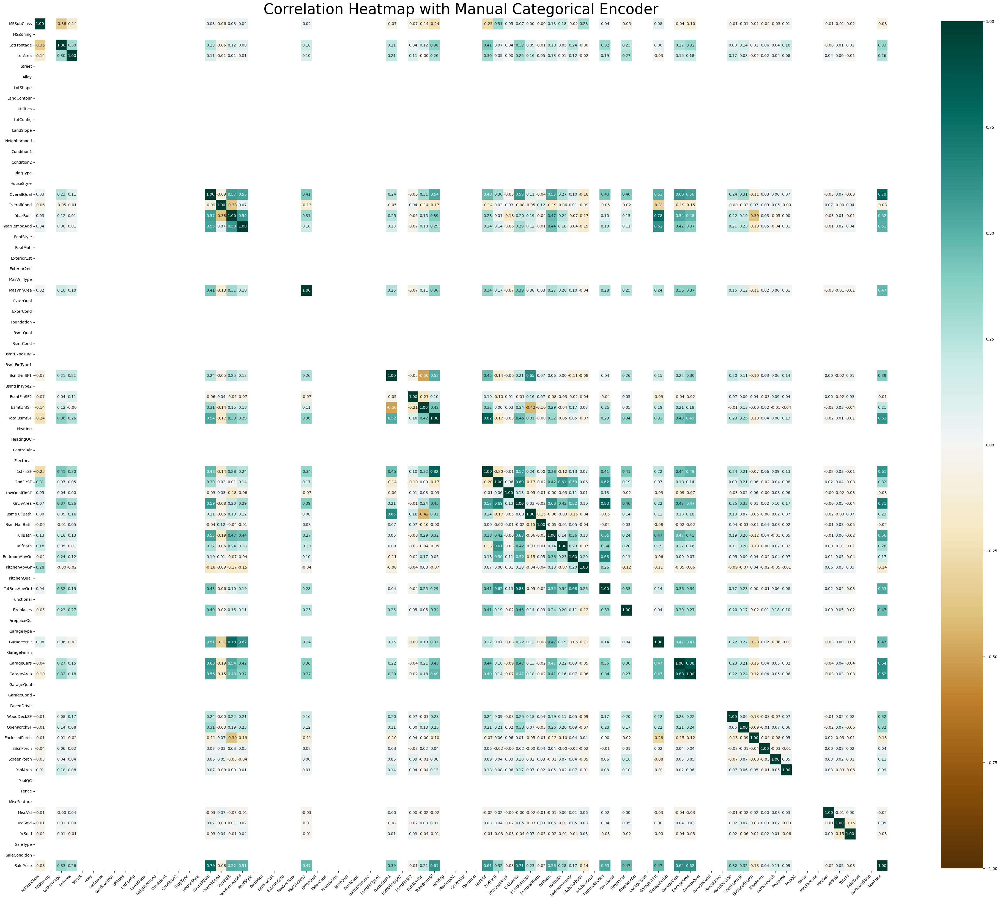

In [ ]:
mpl.rcParams.update(mpl.rcParamsDefault)
corr = housingprnone2.corr(method ='pearson')

plt.figure(figsize=(50, 50))
ax = sns.heatmap(
 corr,
 vmin=-1, vmax=1, center=0,
 cmap='BrBG',
 square=True, annot=True, fmt=".2f",
 cbar=True,cbar_kws={"shrink": 0.8}
)

ax.set_title('Correlation Heatmap with Manual Categorical Encoder', fontdict={'fontsize':38}, pad=12);
ax.set_xticklabels(
 ax.get_xticklabels(),
 rotation=45,
 horizontalalignment='right'
)

plt.savefig('heatmapCatsManual.png', dpi=300, bbox_inches='tight')

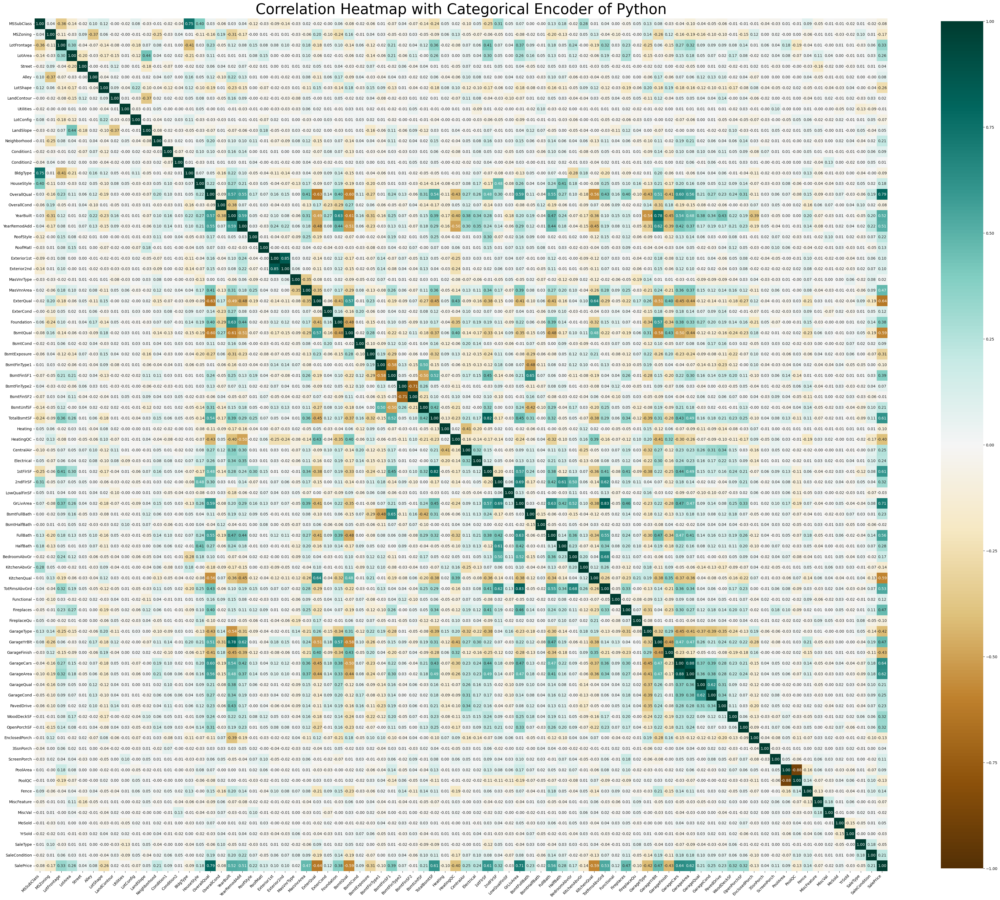

In [ ]:
mpl.rcParams.update(mpl.rcParamsDefault)
corr = housingprnonecat.corr(method ='pearson')

plt.figure(figsize=(50, 50))
ax = sns.heatmap(
 corr,
 vmin=-1, vmax=1, center=0,
 cmap='BrBG',
 square=True, annot=True, fmt=".2f",
 cbar=True,cbar_kws={"shrink": 0.8}
)

ax.set_title('Correlation Heatmap with Categorical Encoder of Python', fontdict={'fontsize':38}, pad=12);
ax.set_xticklabels(
 ax.get_xticklabels(),
 rotation=45,
 horizontalalignment='right'
)
plt.savefig('heatmapCatsOrdinalEncoder.png', dpi=300, bbox_inches='tight')

Se puede ver que la primera matriz de correlación cuenta con espacios vacíos en TODAS las variables categóricas, mientras que la segunda tiene datos. Según la documentación de Pandas, esto puede deberse a que, al asignar de manera manual y bruta los números a las categorías, hubiera una falta de variación en estas, lo cual genera problemas en la varianza de datos y con ello el nivel de relación entre la información. En el caso de aquella matriz tratada con la librería, se puede ver que el sistema ha calculado el mejor modo de codificar las clases de cada categoría para evitar este problema, lo cual da una correlación amplia.

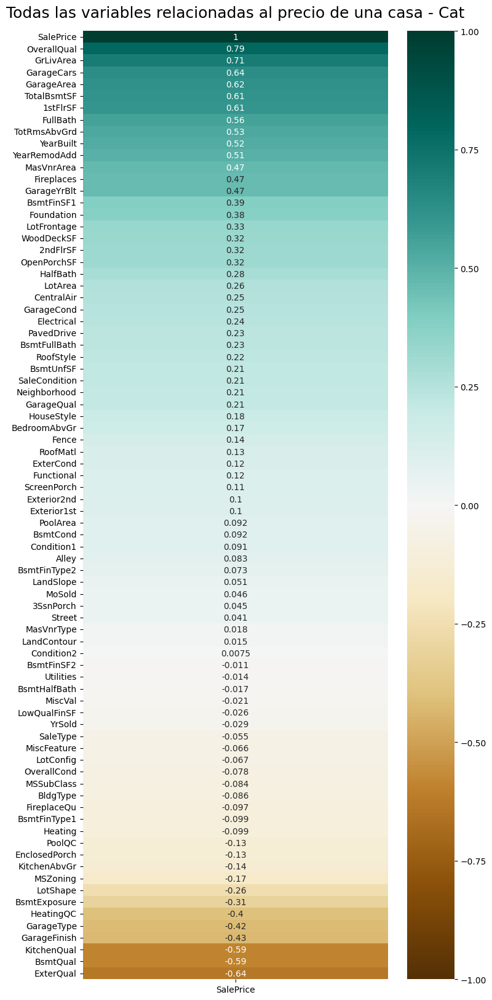

In [ ]:
plt.figure(figsize=(8, 20))
heatmap = sns.heatmap(housingprnonecat.corr()[['SalePrice']].sort_values(by='SalePrice', ascending=False), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Todas las variables relacionadas al precio de una casa - Cat', fontdict={'fontsize':18}, pad=16);

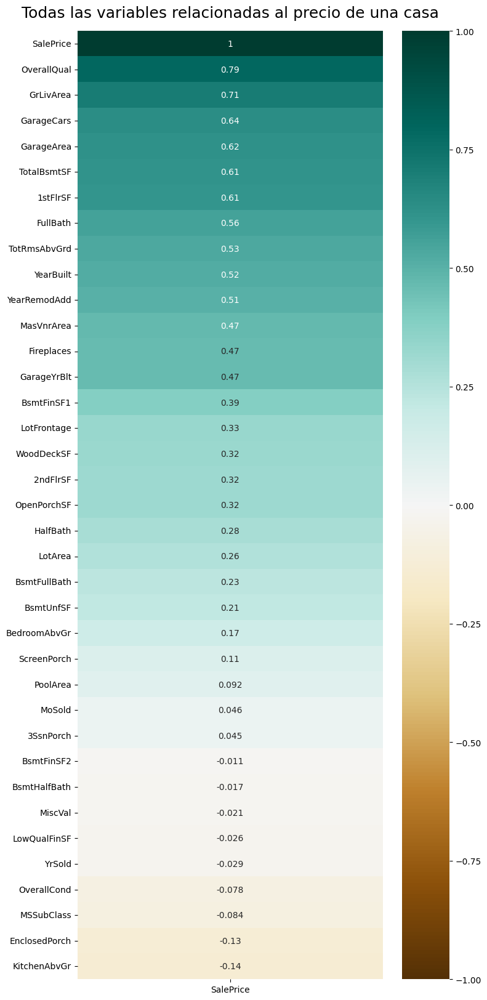

In [ ]:
plt.figure(figsize=(8, 20))
heatmap = sns.heatmap(housingprnone.corr()[['SalePrice']].sort_values(by='SalePrice', ascending=False), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Todas las variables relacionadas al precio de una casa', fontdict={'fontsize':18}, pad=16);

Se puede observar que, incluso con las variables categóricas agregadas, las correlaciones mayores que tiene la columna del precio siguen siendo las mismas que las obtenidas anteriormente. Hay algunos atributos que tomaron un grado de correlación alto en el caso de aquella dataframe con variables categóricas, como la calidad del sótano, exterior, cocina y garaje, pero son más negativas y podrían llegar a contrarrestar el valor del precio, no afectando mucho la regresión.

In [ ]:
housingprnonecat=housingprnonecat.drop(["OverallQual","GrLivArea","TotRmsAbvGrd","TotalBsmtSF","GarageCars","GarageYrBlt"],axis=1)
housingprnonecat

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,3.0,0.150685,0.033420,1.0,1.0,3.0,3.0,0.0,4.0,0.0,5.0,2.0,2.0,0.0,5.0,5,2003,2003,1.0,1.0,12.0,13.0,1.0,0.122500,2.0,4.0,2.0,2.0,4.0,3.0,2.0,0.125089,6.0,0.000000,0.064212,1.0,0.0,1.0,5.0,0.119780,0.413559,0.0,0.333333,0.0,0.666667,0.5,0.375,0.333333,2.0,6.0,0.000000,3.0,1.0,2.0,0.386460,5.0,5.0,2.0,0.000000,0.111517,0.000000,0.0,0.0,0.0,3.0,4.0,1.0,0.00000,2,2008,8.0,4.0,208500
1,20,3.0,0.202055,0.038795,1.0,1.0,3.0,3.0,0.0,2.0,0.0,24.0,1.0,2.0,0.0,2.0,8,1976,1976,1.0,1.0,8.0,8.0,2.0,0.000000,3.0,4.0,1.0,2.0,4.0,1.0,0.0,0.173281,6.0,0.000000,0.121575,1.0,0.0,1.0,5.0,0.212942,0.000000,0.0,0.000000,0.5,0.666667,0.0,0.375,0.333333,3.0,6.0,0.333333,5.0,1.0,2.0,0.324401,5.0,5.0,2.0,0.347725,0.000000,0.000000,0.0,0.0,0.0,3.0,4.0,1.0,0.00000,5,2007,8.0,4.0,181500
2,60,3.0,0.160959,0.046507,1.0,1.0,0.0,3.0,0.0,4.0,0.0,5.0,2.0,2.0,0.0,5.0,5,2001,2002,1.0,1.0,12.0,13.0,1.0,0.101250,2.0,4.0,2.0,2.0,4.0,2.0,2.0,0.086109,6.0,0.000000,0.185788,1.0,0.0,1.0,5.0,0.134465,0.419370,0.0,0.333333,0.0,0.666667,0.5,0.375,0.333333,2.0,6.0,0.333333,5.0,1.0,2.0,0.428773,5.0,5.0,2.0,0.000000,0.076782,0.000000,0.0,0.0,0.0,3.0,4.0,1.0,0.00000,9,2008,8.0,4.0,223500
3,70,3.0,0.133562,0.038561,1.0,1.0,0.0,3.0,0.0,0.0,0.0,6.0,2.0,2.0,0.0,5.0,5,1915,1970,1.0,1.0,13.0,15.0,2.0,0.000000,3.0,4.0,0.0,4.0,1.0,3.0,0.0,0.038271,6.0,0.000000,0.231164,1.0,2.0,1.0,5.0,0.143873,0.366102,0.0,0.333333,0.0,0.333333,0.0,0.375,0.333333,2.0,6.0,0.333333,2.0,5.0,3.0,0.452750,5.0,5.0,2.0,0.000000,0.063985,0.492754,0.0,0.0,0.0,3.0,4.0,1.0,0.00000,2,2006,8.0,0.0,140000
4,60,3.0,0.215753,0.060576,1.0,1.0,0.0,3.0,0.0,2.0,0.0,15.0,2.0,2.0,0.0,5.0,5,2000,2000,1.0,1.0,12.0,13.0,1.0,0.218750,2.0,4.0,2.0,2.0,4.0,0.0,2.0,0.116052,6.0,0.000000,0.209760,1.0,0.0,1.0,5.0,0.186095,0.509927,0.0,0.333333,0.0,0.666667,0.5,0.500,0.333333,2.0,6.0,0.333333,5.0,1.0,2.0,0.589563,5.0,5.0,2.0,0.224037,0.153565,0.000000,0.0,0.0,0.0,3.0,4.0,1.0,0.00000,12,2008,8.0,4.0,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,3.0,0.140411,0.030929,1.0,1.0,3.0,3.0,0.0,4.0,0.0,8.0,2.0,2.0,0.0,5.0,5,1999,2000,1.0,1.0,12.0,13.0,2.0,0.000000,3.0,4.0,2.0,2.0,4.0,3.0,6.0,0.000000,6.0,0.000000,0.407962,1.0,0.0,1.0,5.0,0.142038,0.336077,0.0,0.000000,0.0,0.666667,0.5,0.375,0.333333,3.0,6.0,0.333333,5.0,1.0,2.0,0.324401,5.0,5.0,2.0,0.000000,0.073126,0.000000,0.0,0.0,0.0,3.0,4.0,1.0,0.00000,8,2007,8.0,4.0,175000
1456,20,3.0,0.219178,0.055505,1.0,1.0,3.0,3.0,0.0,4.0,0.0,14.0,2.0,2.0,0.0,2.0,6,1978,1988,1.0,1.0,9.0,10.0,3.0,0.074375,3.0,4.0,1.0,2.0,4.0,3.0,0.0,0.139972,5.0,0.110583,0.252140,1.0,4.0,1.0,5.0,0.399036,0.000000,0.0,0.333333,0.0,0.666667,0.0,0.375,0.333333,3.0,2.0,0.666667,5.0,1.0,3.0,0.352609,5.0,5.0,2.0,0.407235,0.000000,0.000000,0.0,0.0,0.0,3.0,2.0,1.0,0.00000,2,2010,8.0,4.0,210000
1457,70,3.0,0.154110,0.036187,1.0,1.0,3.0,3.0,0.0,4.0,0.0,6.0,2.0,2.0,0.0,5.0,9,1941,2006,1.0,1.0,5.0,5.0,2.0,0.000000,0.0,2.0,4.0,4.0,1.0,3.0,2.0,0.048724,6.0,0.000000,0.375428,1.0,0.0,1.0,5.0,0.19596

In [ ]:
housingprnone=housingprnone.drop(["OverallQual","GrLivArea","TotRmsAbvGrd","TotalBsmtSF","GarageCars","GarageYrBlt"],axis=1)
housingprnone

,MSSubClass,LotFrontage,LotArea,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,60,0.150685,0.033420,5,2003,2003,0.122500,0.125089,0.000000,0.064212,0.119780,0.413559,0.0,0.333333,0.0,0.666667,0.5,0.375,0.333333,0.000000,0.386460,0.000000,0.111517,0.000000,0.0,0.0,0.0,0.00000,2,2008,208500
1,20,0.202055,0.038795,8,1976,1976,0.000000,0.173281,0.000000,0.121575,0.212942,0.000000,0.0,0.000000,0.5,0.666667,0.0,0.375,0.333333,0.333333,0.324401,0.347725,0.000000,0.000000,0.0,0.0,0.0,0.00000,5,2007,181500
2,60,0.160959,0.046507,5,2001,2002,0.101250,0.086109,0.000000,0.185788,0.134465,0.419370,0.0,0.333333,0.0,0.666667,0.5,0.375,0.333333,0.333333,0.428773,0.000000,0.076782,0.000000,0.0,0.0,0.0,0.00000,9,2008,223500
3,70,0.133562,0.038561,5,1915,1970,0.000000,0.038271,0.000000,0.231164,0.143873,0.366102,0.0,0.333333,0.0,0.333333,0.0,0.375,0.333333,0.333333,0.452750,0.000000,0.063985,0.492754,0.0,0.0,0.0,0.00000,2,2006,140000
4,60,0.215753,0.060576,5,2000,2000,0.218750,0.116052,0.000000,0.209760,0.186095,0.509927,0.0,0.333333,0.0,0.666667,0.5,0.500,0.333333,0.333333,0.589563,0.224037,0.153565,0.000000,0.0,0.0,0.0,0.00000,12,2008,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,0.140411,0.030929,5,1999,2000,0.000000,0.000000,0.000000,0.407962,0.142038,0.336077,0.0,0.000000,0.0,0.666667,0.5,0.375,0.333333,0.333333,0.324401,0.000000,0.073126,0.000000,0.0,0.0,0.0,0.00000,8,2007,175000
1456,20,0.219178,0.055505,6,1978,1988,0.074375,0.139972,0.110583,0.252140,0.399036,0.000000,0.0,0.333333,0.0,0.666667,0.0,0.375,0.333333,0.666667,0.352609,0.407235,0.000000,0.000000,0.0,0.0,0.0,0.00000,2,2010,210000
1457,70,0.154110,0.036187,9,1941,2006,0.000000,0.048724,0.000000,0.375428,0.195961,0.557869,0.0,0.000000,0.0,0.666667,0.0,0.500,0.333333,0.666667,0.177715,0.000000,0.109689,0.000000,0.0,0.0,0.0,0.16129,5,2010,266500
1458,20,0.160959,0.039342,6,1950,1996,0.000000,0.008682,0.698100,0.000000,0.170721,0.000000,0.0,0.333333,0.0,0.333333,0.0,0.250,0.333333,0.000000,0.169252,0.427071,0.000000,0.202899,0.0,0.0,0.0,0.00000,4,2010,142125


# Realizando las regresiones de arbol de decisión

Como se estableció antes en la matriz de correlación y análisis estadísticos, se van a eliminar ciertas columnas para llegar a una regresión óptima posible: Calidad general, Área habitable encima del nivel del suelo, Total de cuartos por encima del suelo, Área total del Sótano, Número de autos, y el año de construcción del garaje. El Id ha sido eliminado antes de punto 4.

## Primera regresión, categóricas y numéricas

In [ ]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(housingprnonecat,housingprnonecat.SalePrice,test_size = 0.30 ,random_state = 2)

target_scaler=MinMaxScaler()
from sklearn.tree import DecisionTreeRegressor

target_scaler.fit(y_train.values.reshape(-1, 1))
y_train = target_scaler.transform(y_train.values.reshape(-1, 1))
y_test = target_scaler.transform(y_test.values.reshape(-1, 1))

# Finding best parameters for decision tree
dt = DecisionTreeRegressor(random_state=0)
dt_params = {'max_depth':np.arange(1,50,2),'min_samples_leaf':np.arange(2,15)}

from sklearn.model_selection import GridSearchCV
gs_dt = GridSearchCV(dt,dt_params,cv=3)
gs_dt.fit(x_train,y_train)
a = gs_dt.best_params_
gs_dt,a

NameError: ignored

El número máximo de niveles a crear en este árbol han sido 7, tomando como mínimo muestras de información 2; optimizando la clasificación

In [ ]:
from sklearn.tree import DecisionTreeRegressor


dtr=DecisionTreeRegressor(max_depth=7,min_samples_leaf=2)
model = dtr.fit(x_train,y_train)

y_pred = model.predict(x_test)

yhat = model.predict(x_test)
yhat = target_scaler.inverse_transform(yhat.reshape(-1, 1))

yhat.reshape(1,-1),y_pred


(array([[286272.5       , 177550.        , 364606.5       ,
         197788.88888889, 222833.33333333, 220000.        ,
         225538.46153846, 200203.41666667,  86068.42105263,
         316630.14285714, 215337.5       , 207762.5       ,
         118266.21052632, 147323.07692308, 104266.66666667,
         225538.46153846, 286272.5       , 283461.66666667,
         240192.78571429, 286272.5       , 311312.        ,
         171877.77777778, 173566.63636364, 222833.33333333,
         437420.33333333, 260500.        , 110050.        ,
         260500.        , 205263.63636364, 437420.33333333,
         316630.14285714, 154468.47826087, 290000.        ,
         123300.        , 175642.17647059, 213474.        ,
         132932.35294118, 343821.5       , 343821.5       ,
         437420.33333333, 173566.63636364, 217209.25      ,
         152100.        ,  86068.42105263, 108741.16666667,
         240192.78571429,  78854.54545455, 135416.37037037,
         110050.        , 139809.5666666

In [ ]:
from sklearn.metrics import mean_squared_log_error
from sklearn.metrics import mean_absolute_error, mean_squared_error

msle=mean_squared_log_error(y_pred,y_test)
rmsle=np.sqrt(msle)
print('RMLSE for the data:',rmsle) # Valor del Logaritmo de la raiz del error cuadrático medio. Si da con menos errores, está mejor
print('MAE:',mean_absolute_error(y_pred,y_test)) # Valor del Error Absoluto Medio. Si da con menos errores, está mejor
print('MSE:',mean_squared_error(y_pred,y_test)) # Valor del Error Cuadrado Medio. Si da con menos errores, está mejor

RMLSE for the data: 0.005197654238969758
MAE: 0.00198798291253671
MSE: 8.461968154788997e-05


Los errores obtenidos de esta regresión han sido muy bajos, con valores que se acercan a 0, lo cual es muy positivo, indicando que la estrategia tomada ha sido beneficiosa

In [ ]:
!pip install graphviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from sklearn import tree
import graphviz
dot_data = tree.export_graphviz(dtr, out_file=None)
graph = graphviz.Source(dot_data)
graph.render("iriscat")

'iriscat.pdf'

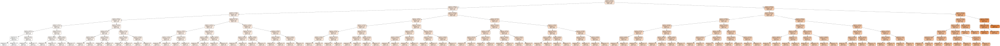

In [ ]:
dot_data = tree.export_graphviz(dtr, out_file=None,
                      feature_names=x_train.columns,
                      filled=True, rounded=True,
                      special_characters=True)
graph = graphviz.Source(dot_data)
graph

In [ ]:
#Para realizar predicciones

roundpreds = [round(item, 3) for item in y_pred]
ind=roundpreds.index(0.354)
yhat[ind]

array([286272.5])

El árbol de decisión generado da a conocer una cohesión entre valores de precio estándar en las comparaciones como los normalizados en los resultados de predicción. A partir de una predicción desde la identificación del índice de la predicción normalizada y su uso en la estándar, se pueden sacar las siguientes conclusiones:

-	Aquellas casas con un área de sótano terminado tipo 1 de 282 (5%) pies llegan a un valor alrededor de 296, mientras que aquellas con un valor más grande, de 1185 (21%) pies, acumulan 345 mil dólares aproximadamente.

-	Aquellas casas con electricidad fuera de las categorías de fusibles A, F, P, mixta y no identificadas tienen un valor máximo de 39 mil dólares aproximadamente.

-	Las casas con un garaje completado o no registrado tienen un valor alrededor de 286 mil dólares, mientras que aquellas parcialmente completadas o sin finalizar acumulan 271 mil dólares aproximadamente.

-	Las casas que pertenezcan a los barrios Timber y Veenker de la zona tienen un valor aproximado de 515 mil dólares, menos que las casas de otros barrios con 567 mil dólares. Así mismo, las casas con un área de 1360 (29%) pies para el primer piso aportan 400 mil dólares aproximadamente. Así mismo, las casas con 2 a 3 (31%) dormitorios por encima del nivel del suelo pueden aportar un valor cercano a los 377 mil dólares.


## Segunda regresión, sólo numéricas

In [ ]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(housingprnone,housingprnone.SalePrice,test_size = 0.30 ,random_state = 2)

target_scaler=MinMaxScaler()
from sklearn.tree import DecisionTreeRegressor
target_scaler.fit(y_train.values.reshape(-1, 1))
y_train = target_scaler.transform(y_train.values.reshape(-1, 1))
y_test = target_scaler.transform(y_test.values.reshape(-1, 1))

# Finding best parameters for decision tree
dt = DecisionTreeRegressor(random_state=0)
dt_params = {'max_depth':np.arange(1,50,2),'min_samples_leaf':np.arange(2,15)}

from sklearn.model_selection import GridSearchCV
gs_dt = GridSearchCV(dt,dt_params,cv=3)
gs_dt.fit(x_train,y_train)
a = gs_dt.best_params_
gs_dt,a

(GridSearchCV(cv=3, estimator=DecisionTreeRegressor(random_state=0),
              param_grid={'max_depth': array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33,
        35, 37, 39, 41, 43, 45, 47, 49]),
                          'min_samples_leaf': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])}),
 {'max_depth': 9, 'min_samples_leaf': 3})

El número máximo de niveles a crear en este árbol han sido 9, tomando como mínimo 3 muestras de información. Las cifras en este árbol, mayores comparadas a las del anterior, pueden deberse a que, sin la ayuda de categorías externas a las numéricas, no se le facilite el organizar los niveles, por lo que necesita ver más rangos de precio necesarios

In [ ]:
from sklearn.tree import DecisionTreeRegressor


dtr=DecisionTreeRegressor(max_depth=9,min_samples_leaf=3)
model = dtr.fit(x_train,y_train)
y_pred = model.predict(x_test)
y_pred

yhat = model.predict(x_test)
yhat = target_scaler.inverse_transform(yhat.reshape(-1, 1))

yhat.reshape(1,-1),y_pred

(array([[286000.        , 178000.        , 360803.25      ,
         197250.        , 223500.        , 219666.66666667,
         226540.        , 200833.33333333,  84842.85714286,
         318020.33333333, 215000.        , 207280.        ,
         118000.        , 147000.        , 103600.        ,
         225000.        , 289030.        , 283461.66666667,
         239949.83333333, 289030.        , 310166.66666667,
         172500.        , 174000.        , 222166.66666667,
         437420.33333333, 259700.        , 109976.92307692,
         259700.        , 205000.        , 437420.33333333,
         318020.33333333, 155000.        , 289030.        ,
         123900.        , 176472.33333333, 212750.        ,
         132281.25      , 345660.75      , 345660.75      ,
         461150.        , 173000.        , 217209.25      ,
         151633.33333333,  87875.        , 108479.66666667,
         239949.83333333,  80100.        , 135035.71428571,
         110916.66666667, 141000.       

In [ ]:
from sklearn.metrics import mean_squared_log_error
from sklearn.metrics import mean_absolute_error, mean_squared_error

msle=mean_squared_log_error(y_pred,y_test)
rmsle=np.sqrt(msle)
print('RMLSE for the data:',rmsle) # Valor del Logaritmo de la raiz del error cuadrático medio. Si da con menos errores, está mejor
print('MAE:',mean_absolute_error(y_pred,y_test)) # Valor del Error Absoluto Medio. Si da con menos errores, está mejor
print('MSE:',mean_squared_error(y_pred,y_test)) # Valor del Error Cuadrado Medio. Si da con menos errores, está mejor

RMLSE for the data: 0.00485962963407564
MAE: 0.0016036468309816839
MSE: 7.354949069675055e-05


Los errores obtenidos de esta regresión han sido ligeramente menores a la anterior regresión, indicando que ambos caminos pueden ser válidos para la aplicación de árboles de decisión

In [ ]:
from sklearn import tree
import graphviz
dot_data = tree.export_graphviz(dtr, out_file=None)
graph = graphviz.Source(dot_data)
graph.render("iris")

'iris.pdf'

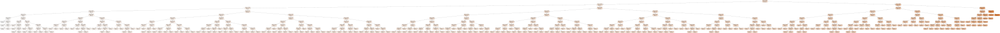

In [ ]:
dot_data = tree.export_graphviz(dtr, out_file=None,
                      feature_names=x_train.columns,
                      filled=True, rounded=True,
                      special_characters=True)
graph = graphviz.Source(dot_data)
graph

In [ ]:
#Para realizar predicciones

roundpreds = [round(item, 3) for item in y_pred]
ind=roundpreds.index(0.6)
yhat[ind]

array([461150.])

El árbol de decisión generado da a conocer los distintos rangos de decisión y predicción del precio, así como las variables que lo complementan:
-	Las casas vendidas antes de julio-agosto con un valor aproximado de 58 mil dólares llegan a los 60 - 66 mil dólares, en mayo llegando incluso de máximo a 185 dólares, mientras que en meses posteriores llegan a los 230 mil dólares. Las casas vendidas cerca del 2007 tuvieron 128 a 154 mil dólares de ganancia, mientras que las del 2008 al 2009 en 175 a 215 mil dólares. Las casas remodeladas en los 70 a 80 ganan 155 a 169 mil dólares; y las construidas en 1971 a 1993 ganan 162 a 180 mil Sus.

-	Las casas con un área de garaje aproximados a 312 pies cuadrados (el 22% de 1416) se venden a 90 mil dólares, mientras aquellas de 425 (29%) pies cuadrados pueden ofrecerse a 120 mil Sus, 147 mil Sus con 496 pies, 297 pies dando 155 mil dólares, 397 pies dan 190 mil dólares, 172 mil Sus en 510 pies, 618 pies dan 200 Sus y 794 pies dan 300 mil Sus.

-	Los inmuebles con pies de calle en la parcela de 34 a 37 de área proporcionan 99 mil y 164 dólares del precio respectivamente, con aquellos de 53 a 60 pies de frente ganando 180 a 199 mil Sus. Así mismo, aquellas casas con un área de 516 a 563 pies cuadrados en el primer piso ganan 115 a 123 mil dólares, mientras que las de 938 a 1032 pies obtienen 150 a 250 mil dólares. Las de 392 a 743 pies cuadrados en el segundo piso ganan 220 a 310 mil dólares.

-	Las casas con plataforma de madera de 59 a 68 pies (7 – 8%) ganan 147 a 210 mil dólares, con las de 128 pies (15%) ganando 286 mil Sus. Las de subclase 65 a 75 ganan 168 a 189 mil dólares. Las de condición general media (5.5) tienen 172 mil dólares de ganancia. Las casas con ninguna o al menos 1 (16%) chimenea ganan 174 mil dólares. Las casas con un área de revestimiento de mampostería de 64 pies (4%) ganan 196 dólares. Las casas con porche de 136 (25%) pies ganan 461 mil dólares respectivamente.

-	Las casas con ninguno a un solo (%16) baño en el sótano ganan 259 mil dólares, las de pocos a un solo (25%) baño parcial ganan 318 mil dólares. Las casas con menos o igual a 2 cuartos aproximadamente se venden desde 82 mil a 370 mil dólares aproximadamente, y las que lo superen pueden llegar a los 380 mil dólares. Las casas con sótano finalizado de tipo 1 de 451 (8%) pies ganan 151 mil dólares; mientras que las casas con sótano sin terminar de 467 a 770 pies (20-33%) gana 162 a 233 mil dólares.


# Discusión de resultados

A partir de las regresiones realizadas, se regresan a las hipótesis antes planteadas, y se puede observar que:
-	Las casas han tenido valores más altos dentro del rango de mayo a septiembre, llegando incluso a cifras alrededor de 200 mil dólares.
-	El garaje con los precios más altos predomina en aquellos con 794 pies cuadrados de área, más que en aquellos dentro del rango del 400 a 500. Sin embargo, hay más distribución de rangos de precios dentro del conjunto establecido, lo cual indica una frecuencia de áreas de garaje posible para este cálculo.
-	Hay mayor precio ganado en casas que se vendieron VARIOS AÑOS luego de su construcción y/o remodelación que en aquellas que lo hacen en un lapso menor de tiempo. Esto talvez se deba al valor de antigüedad de la casa en sí, siendo muchas de estas de los 70’ a los 90’.
-	El área de la parcela no influye mucho en el aumento del valor del precio, sólo en aquellos inmuebles más pequeños que el rango de 1300 a 300 mil pies cuadrados. Para los más grandes, el precio aumentaría más por los cuartos, el segundo piso, porches y el garaje.

Por lo tanto, adjunto a las comparaciones de los dos modelos, se puede determinar que, de todas las variables que pueden categorizar los precios, pueden ser más influyentes el área del garaje, los años de venta y construcción/remodelación, el área del primer piso y el área del sótano terminado de tipo 1; secundadas del barrio, el número de habitaciones dormitorio o baño, entre otras mencionadas en la interpretación de los árboles de decisión
